## Оглавление
- [0.1 Установка зависимостей](#01-установка-зависимостей)
- [0.2 Импорт библиотек](#02-импорт-библиотек)
- [0.3 Структура проекта](#03-структура-проекта)
- [1 Сбор аннотаций](#1-сбор-аннотаций)
- [2 Превью датасета](#2-превью-датасета)
- [3 OCR](#3-ocr)
- [4 VLM Qwen2.5-VL](#4-vlm-qwen25-vl)
- [5 CLIP](#5-clip)
- [6 Оценка моделей](#6-оценка-моделей)
- [7 Интерпретации CLIP](#7-интерпретации-clip)
- [8 Кейсы визуализации](#8-кейсы-визуализации)
- [9 Экспорт результатов](#9-экспорт-результатов)
- [10 Выводы](#10-выводы)



<a name="01-установка-зависимостей"></a>
## [0.1] Установка зависимостей


In [ ]:
!pip -q install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip -q install "transformers>=4.44.2" accelerate bitsandbytes datasets pillow scikit-learn matplotlib opencv-python pandas einops
!pip -q install easyocr

#ппробуем установить pytorch-grad-cam, если не получится, ставим из гитхаба
import subprocess, sys

def try_pip_install(pkg):
    return subprocess.call([sys.executable, "-m", "pip", "install", "-q", pkg])

rc = try_pip_install("pytorch-grad-cam")
if rc != 0:
    rc2 = try_pip_install("git+https://github.com/jacobgil/pytorch-grad-cam.git")


<a name="02-импорт-библиотек"></a>
## [0.2] Импорт задействованных библиотек

In [ ]:
import torch
import cv2
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support
from tqdm.auto import tqdm
from transformers import CLIPProcessor, CLIPModel
from transformers import AutoProcessor, AutoModelForVision2Seq
import easyocr
import os, json, random, re, math, gc
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import re, json
import torch.nn as nn



<a name="03-структура-проекта"></a>
## [0.3] Структура проекта и создание папок

In [ ]:

BASE_DIR = Path("/content/memes_project")
MEMES_DIR = BASE_DIR / "memes"
NEG_DIR = MEMES_DIR / "Негативно"
NEU_DIR = MEMES_DIR / "Нейтрально"
ANN_PATH = BASE_DIR / "annotations.csv"

NEG_DIR.mkdir(parents=True, exist_ok=True)
NEU_DIR.mkdir(parents=True, exist_ok=True)

print("Папки готовы:")
print(" -", NEG_DIR)
print(" -", NEU_DIR)


Папки готовы:
 - /content/memes_project/memes/Негативно
 - /content/memes_project/memes/Нейтрально


<a name="1-сбор-аннотаций"></a>
## [1] Сбор аннотаций из моих папок -> annotations.csv


In [ ]:
def build_my_annotations(force=False):
    mapping = {"Негативно":"toxic", "Нейтрально":"non_toxic"}
    if force or not ANN_PATH.exists():
        rows = []
        for subfolder, label in mapping.items():
            folder = MEMES_DIR / subfolder
            for p in folder.iterdir():
                if p.suffix.lower() in [".jpg",".jpeg",".png",".webp",".bmp"]:
                    rows.append({"source":"mine","filename": f"{subfolder}/{p.name}","label": label,"comment": ""})
        df = pd.DataFrame(rows)
        df.to_csv(ANN_PATH, index=False)
    else:
        df = pd.read_csv(ANN_PATH)
    return df

df_mine = build_my_annotations(force=False)
print(f"Датасет: {len(df_mine)} изображений")
df_mine.head(3)

Датасет: 51 изображений


,source,filename,label,comment
0,mine,Негативно/132a1d5379e5def763cd28a545aaf285.png,toxic,NaN
1,mine,Негативно/d4bd63a693c57d3e89f2e975ab4810d6.jpg,toxic,NaN
2,mine,Негативно/043dc85c806f95d25f333db6b452718f.png,toxic,NaN


<a name="2-превью-датасета"></a>
## [2] Превью датасета: 5 toxic + 5 non_toxic

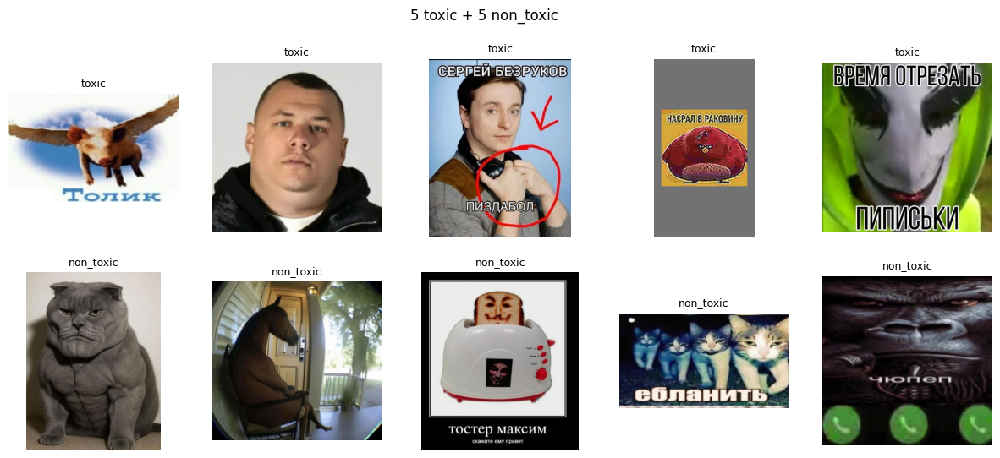

In [ ]:
def sample_by_label(df, lab, k=5):
    sub = df[df["label"]==lab]
    return sub.sample(min(k, len(sub)), random_state=42)

def show_grid_from_disk(root: Path, subdf: pd.DataFrame, title="preview", cols=5, file_col="filename", label_col="label"):
    rows = int(np.ceil(len(subdf)/cols))
    plt.figure(figsize=(cols*3, rows*3)); plt.suptitle(title)
    for i, r in enumerate(subdf.itertuples(), 1):
        img = Image.open(root / getattr(r, file_col)).convert("RGB")
        plt.subplot(rows, cols, i); plt.imshow(img); plt.axis("off")
        plt.title(getattr(r, label_col), fontsize=9)
    plt.show()

show_mine = pd.concat([sample_by_label(df_mine,"toxic",5),
                       sample_by_label(df_mine,"non_toxic",5)], ignore_index=True)
show_grid_from_disk(MEMES_DIR, show_mine, title="5 toxic + 5 non_toxic")

<a name="3-ocr"></a>
## [3] OCR (RU): функции + быстрая проверка на 3 случайных

In [ ]:
ocr_reader = easyocr.Reader(['ru'])

def ocr_image_from_pil(pil_image):
    arr = np.array(pil_image)[:, :, ::-1] #RGB->BGR
    res = ocr_reader.readtext(arr, detail=0)
    text = " ".join([t.strip() for t in res if isinstance(t,str)]).strip()
    return text

def ocr_image_from_disk(path: Path):
    pil = Image.open(path).convert("RGB")
    return ocr_image_from_pil(pil)

#быстрый прогон 3 случайных
for r in df_mine.sample(min(3, len(df_mine)), random_state=1).itertuples():
    print("-", r.filename, ":", ocr_image_from_disk(MEMES_DIR / r.filename)[:150])

- Негативно/71d9ebab859db52bfc3f55f6082d272d.png : [АНАЛЬНАЯ ВОШЪ
- Негативно/043dc85c806f95d25f333db6b452718f.png : ",цгишна ТВАРЬ
- Нейтрально/ef99994b952a6143d840e447a3bf729b.png : нщЕШиь


<a name="4-vlm-qwen25-vl"></a>
## [4] VLM (Qwen2.5-VL): init + prompt + generate + RU parser

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
VLM_ID = "Qwen/Qwen2.5-VL-3B-Instruct"
vlm_dtype = torch.float16

vlm_processor = AutoProcessor.from_pretrained(VLM_ID, trust_remote_code=True)
vlm_model = AutoModelForVision2Seq.from_pretrained(
    VLM_ID,
    trust_remote_code=True,
    torch_dtype=vlm_dtype,
    low_cpu_mem_usage=True,
    device_map="auto",
)

def vlm_prompt(ocr_text: str):
    return f"""
Ты - модератор контента. Классифицируй мем по токсичности.
Определи ровно один класс: "Токсик" или "Нейтральный".
Верни JSON с полями: "class", "rationale".
Подсказки:
- Учитывай изображение И текст (OCR).
- Токсик: оскорбления, ненависть, агрессия, унижение, мат, что может обидеть.
- Нейтральный: безвредный, нейтральный, без оскорблений.

OCR: {ocr_text.strip() or "нет"}
""".strip()

def _vlm_generate_core(pil_image, ocr_text="", use_device="cuda"):
    messages = [{
        "role": "user",
        "content": [
            {"type": "image", "image": pil_image},
            {"type": "text",  "text": vlm_prompt(ocr_text)},
        ]
    }]
    chat_str = vlm_processor.apply_chat_template(messages, add_generation_prompt=True, tokenize=False)
    inputs = vlm_processor(text=chat_str, images=[pil_image], return_tensors="pt", padding=True)

    if use_device == "cuda" and torch.cuda.is_available():
        inputs = {k:(v.to("cuda") if hasattr(v,"to") else v) for k,v in inputs.items()}
        model = vlm_model
    else:
        inputs = {k:(v.to("cpu") if hasattr(v,"to") else v) for k,v in inputs.items()}
        model = vlm_model.to("cpu")

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=128,
            do_sample=False,
            use_cache=True
        )
    return vlm_processor.batch_decode(out, skip_special_tokens=True)[0]

import unicodedata, re, json

def _norm_str(s):
    s = (s or "").strip().replace("ё","е").replace("Ё","Е")
    return unicodedata.normalize("NFKC", s)

def _extract_json_block(text):
    t = _norm_str(text)
    m = re.search(r"```json\s*({.*?})\s*```", t, flags=re.S|re.I)
    if not m:
        m = re.search(r"(\{.*\})", t, flags=re.S)
    if not m:
        return None
    block = m.group(1)
    block = block.replace("Токсик","toxic").replace("Нейтральный","non_toxic")
    try:
        return json.loads(block)
    except:
        return None

def _parse_first_line(t):
    first = _norm_str(t).splitlines()[0].lower()
    if "токс" in first: return "toxic"
    if "нейтр" in first or "non" in first: return "non_toxic"
    return None

def _parse_keywords_ru(text):
    t = _norm_str(text).lower()
    tox_kw = ["ебан", "сука", "пидор", "хуй", "гандон", "мат", "твар", "анальн", "нах", "пизд", "дебил", "долбо"]
    non_kw = ["нейтр", "норм", "безвред", "никого не оскорб", "положит"]
    if any(k in t for k in tox_kw): return "toxic"
    if any(k in t for k in non_kw): return "non_toxic"
    return None

def classify_vlm(pil_image, ocr_text=""):
    try:
        raw = _vlm_generate_core(pil_image, ocr_text=ocr_text, use_device="cuda")
    except:
        if torch.cuda.is_available(): torch.cuda.empty_cache()
        raw = _vlm_generate_core(pil_image, ocr_text=ocr_text, use_device="cpu")

    cls = _parse_first_line(raw)
    if not cls:
        js = _extract_json_block(raw)
        if isinstance(js, dict):
            c = _norm_str(js.get("class","")).lower()
            if "токс" in c or "toxic" in c: cls = "toxic"
            if "нейтр" in c or "non" in c: cls = "non_toxic"
    if not cls:
        cls = _parse_keywords_ru(raw) or "non_toxic"

    rationale = ""
    js = _extract_json_block(raw)
    if isinstance(js, dict):
        rationale = js.get("rationale","")

    return cls, raw, rationale


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
The image processor of type `Qwen2VLImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. Note that this behavior will be extended to all models in a future release.
/usr/local/lib/python3.12/dist-packages/transformers/models/auto/modeling_auto.py:2284: Futu

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

<a name="5-clip"></a>
## [5] CLIP (ViT-L/14): init + RU-классы + scorer с OCR


In [ ]:
CLIP_ID = "openai/clip-vit-large-patch14"
clip_model = CLIPModel.from_pretrained(CLIP_ID).to(device)
clip_processor = CLIPProcessor.from_pretrained(CLIP_ID)

class_texts = [
    "токсичный, оскорбительный, агрессивный мем",
    "нейтральный, безвредный, позитивный мем"
]
class_labels = ["toxic", "non_toxic"]

def clip_score(pil_image, ocr_txt=""):
    ocr_txt = (ocr_txt or "").replace("\n", " ").strip()
    prompts = [f"{t}. Текст в меме: {ocr_txt}" for t in class_texts]
    inputs = clip_processor(
        text=prompts,
        images=pil_image,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=77
    ).to(device)
    with torch.no_grad():
        out = clip_model(**inputs)
        probs = out.logits_per_image.softmax(dim=-1).squeeze(0).detach().cpu().numpy()
    pred_idx = int(np.argmax(probs))
    return class_labels[pred_idx], probs


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


<a name="6-оценка-моделей"></a>
## [6] Оценка: инференс VLM и CLIP + метрики (ACC / P / R / F1 / CM)


In [ ]:
def run_eval_mine(df, method="vlm", max_n=None):
    rows, fails = [], []
    items = df if max_n is None else df.sample(min(max_n, len(df)), random_state=0)
    for r in tqdm(items.itertuples(), total=len(items), desc=f"eval-mine-{method}"):
        try:
            pil = Image.open(MEMES_DIR / r.filename).convert("RGB")
            ocr = ocr_image_from_pil(pil)
            if method == "vlm":
                pred, raw, rat = classify_vlm(pil, ocr_text=ocr)
                rows.append({"gt": r.label, "pred": pred, "file": r.filename, "ocr": ocr, "rationale": rat})
            elif method == "clip":
                pred, probs = clip_score(pil, ocr_txt=ocr)
                rows.append({"gt": r.label, "pred": pred, "file": r.filename, "ocr": ocr,
                             "probs_toxic": float(probs[0]), "probs_nontoxic": float(probs[1])})
        except Exception as e:
            fails.append({"file": r.filename, "error": type(e).__name__, "msg": str(e)[:180]})
            rows.append({"gt": r.label, "pred": "non_toxic", "file": r.filename, "ocr": "",
                         "rationale": f"[SKIPPED due to {type(e).__name__}] {str(e)[:120]}"})
            continue

    res = pd.DataFrame(rows)
    if fails:
        display(pd.DataFrame(fails))

    y_true = res["gt"].values
    y_pred = res["pred"].values
    acc = accuracy_score(y_true, y_pred)
    p, r, f, _ = precision_recall_fscore_support(
        y_true, y_pred, labels=["toxic","non_toxic"], average="binary", pos_label="toxic", zero_division=0
    )
    cm = confusion_matrix(y_true, y_pred, labels=["toxic","non_toxic"])
    return res, {"acc": acc, "precision": p, "recall": r, "f1": f, "cm": cm.tolist()}

def print_metrics(name, m):
    print(f"\n== {name} ==")
    pretty = {k:(round(v,4) if isinstance(v,float) else v) for k,v in m.items()}
    print(json.dumps(pretty, indent=2))
    print("CM rows=gt [toxic, non_toxic], cols=pred [toxic, non_toxic]")

clip_mine, clip_mine_m = run_eval_mine(df_mine, method="clip", max_n=None)
print_metrics("CLIP", clip_mine_m)

vlm_mine,  vlm_mine_m = run_eval_mine(df_mine, method="vlm",  max_n=None)
print_metrics("VLM", vlm_mine_m)



eval-mine-clip:   0%|          | 0/51 [00:00<?, ?it/s]


== CLIP ==
{
  "acc": 0.5098,
  "precision": 0.5,
  "recall": 0.08,
  "f1": 0.1379,
  "cm": [
    [
      2,
      23
    ],
    [
      2,
      24
    ]
  ]
}
CM rows=gt [toxic, non_toxic], cols=pred [toxic, non_toxic]


eval-mine-vlm:   0%|          | 0/51 [00:00<?, ?it/s]

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.



== VLM ==
{
  "acc": 0.549,
  "precision": 0.5227,
  "recall": 0.92,
  "f1": 0.6667,
  "cm": [
    [
      23,
      2
    ],
    [
      21,
      5
    ]
  ]
}
CM rows=gt [toxic, non_toxic], cols=pred [toxic, non_toxic]


<a name="7-интерпретации-clip"></a>
## [7] Интерпретации CLIP: heatmap

In [ ]:
class _CLIPVisionWrapper(nn.Module):
    def __init__(self, vision_model):
        super().__init__()
        self.vm = vision_model
    def forward(self, pixel_values):
        out = self.vm(pixel_values=pixel_values, output_hidden_states=False)
        return out.pooler_output

_vision_wrapped = _CLIPVisionWrapper(clip_model.vision_model).to(device)

def _clip_target_layer():
    lyr = _vision_wrapped.vm.encoder.layers[-1]
    for name in ["layer_norm1", "ln_1", "layer_norm"]:
        if hasattr(lyr, name):
            return getattr(lyr, name)
    if hasattr(lyr, "mlp"):
        return lyr.mlp
    raise AttributeError("No suitable target layer")

def gradcam_clip_heatmap(pil_image):
    if hasattr(_vision_wrapped.vm, "set_attn_implementation"):
        _vision_wrapped.vm.set_attn_implementation("eager")
    _vision_wrapped.eval().to(device)
    img_tensor = clip_processor(images=pil_image, return_tensors="pt")["pixel_values"].to(device)
    def reshape_transform(tensor):
        if isinstance(tensor, (tuple, list)):
            tensor = tensor[0]
        b, n, c = tensor.shape
        side = int((n - 1) ** 0.5)
        return tensor[:, 1:, :].reshape(b, side, side, c).permute(0, 3, 1, 2)
    target_layer = _clip_target_layer()
    with EigenCAM(model=_vision_wrapped, target_layers=[target_layer], reshape_transform=reshape_transform) as cam:
        grayscale_cam = cam(input_tensor=img_tensor)[0]
    heat = cv2.resize(grayscale_cam, (pil_image.width, pil_image.height), interpolation=cv2.INTER_CUBIC)
    rgb = np.array(pil_image.convert("RGB")).astype(np.float32) / 255.0
    vis = show_cam_on_image(rgb, heat, use_rgb=True)
    return Image.fromarray(vis)

<a name="8-кейсы-визуализации"></a>
## [8] Кейсы: визуализация (VLM построчно, CLIP с картами внимания)


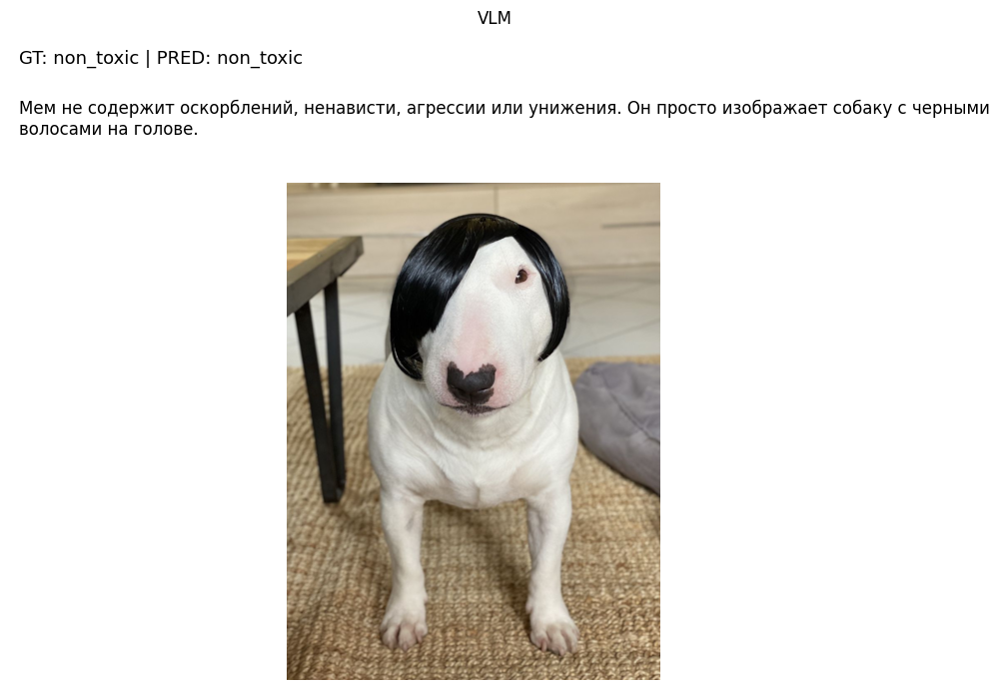

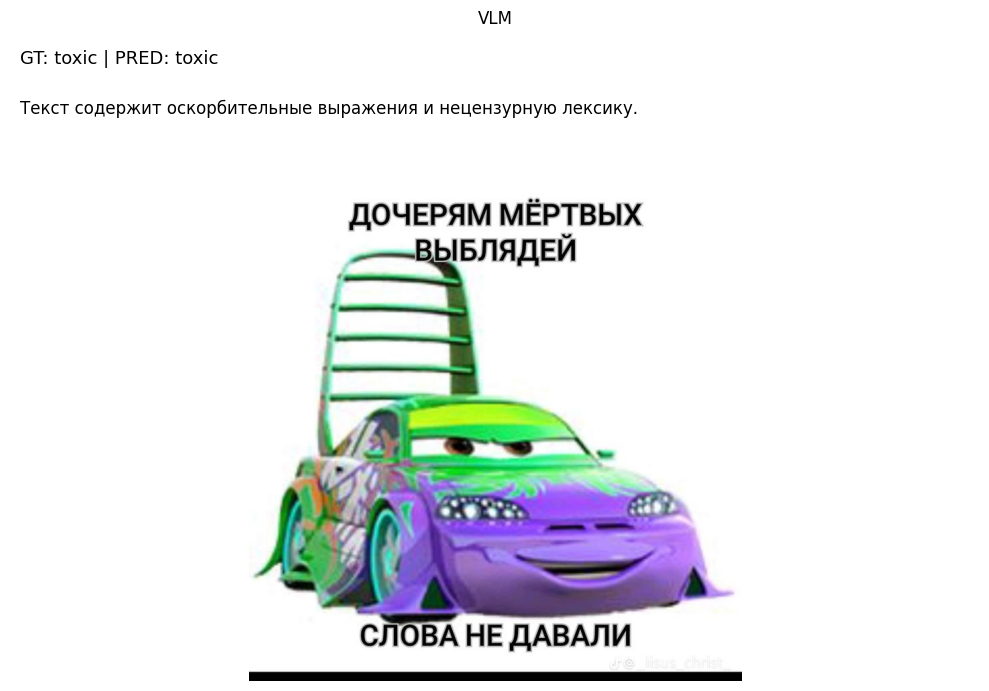

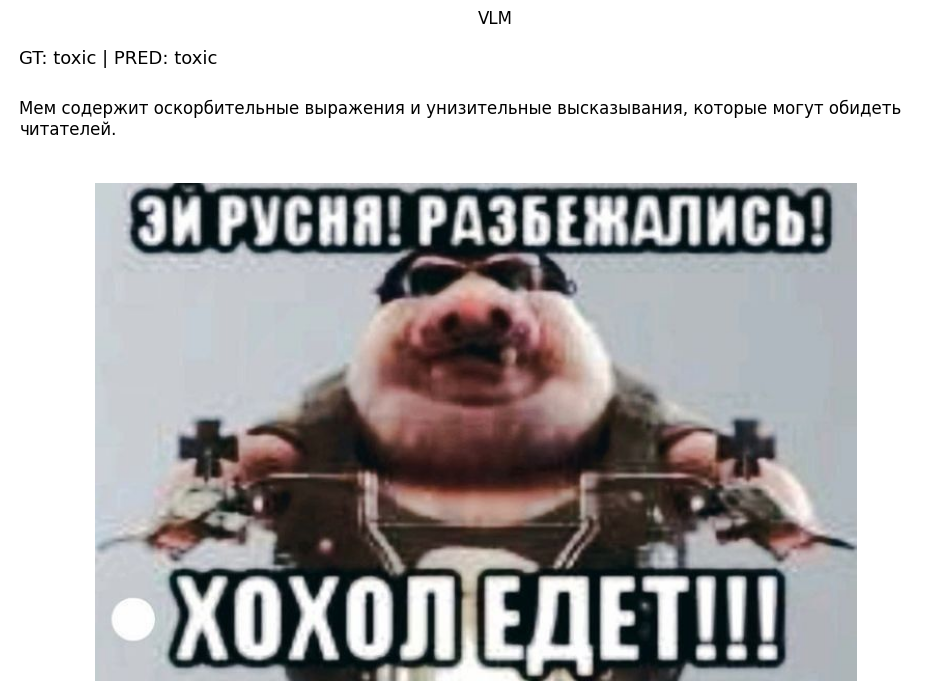

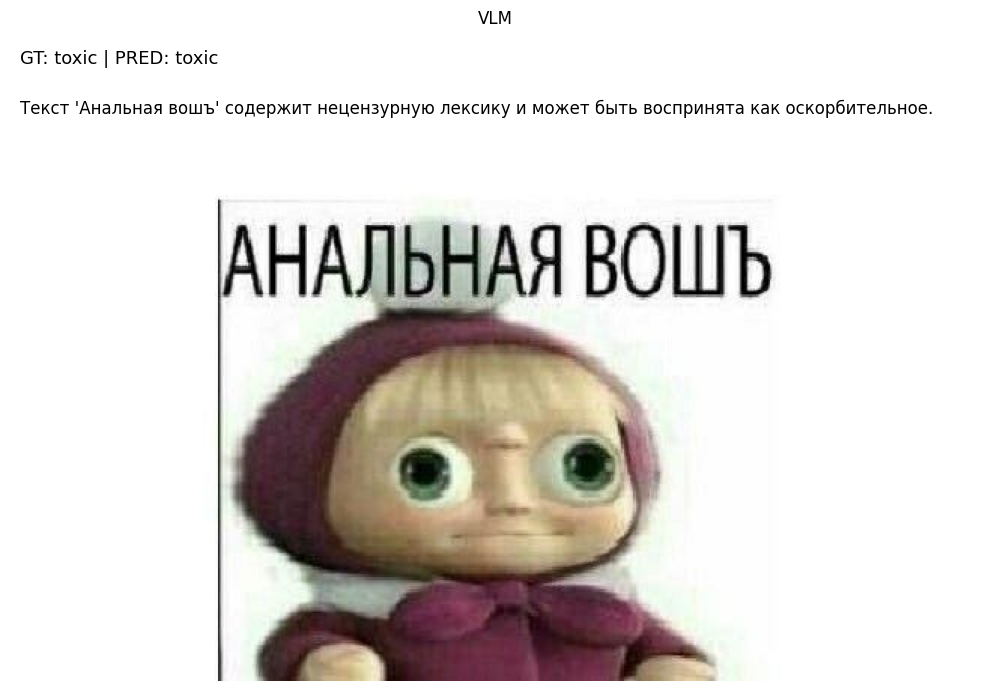

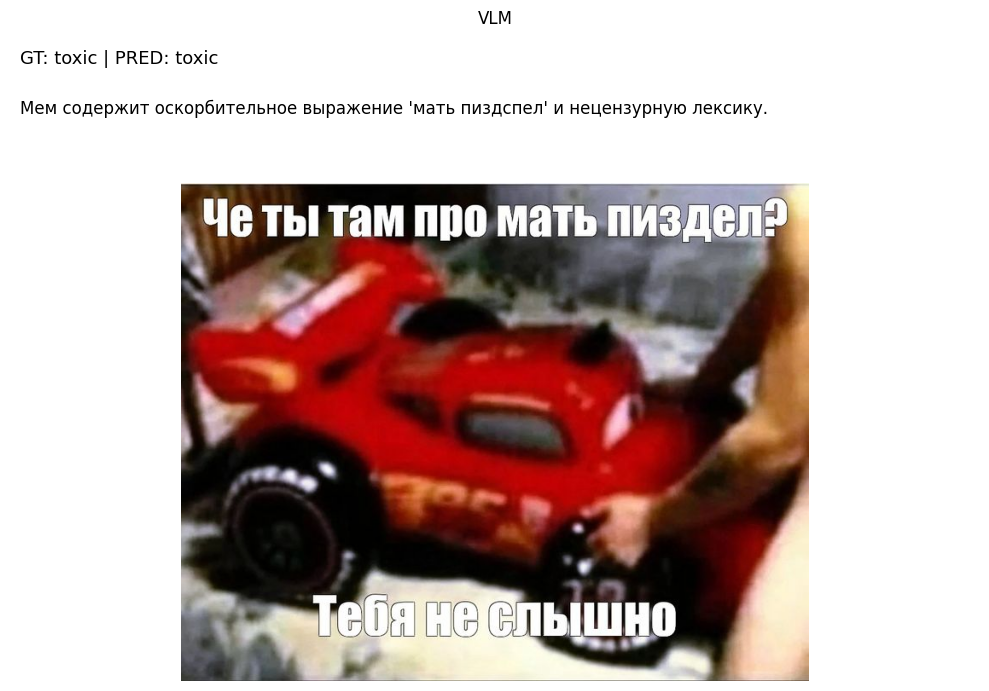

...

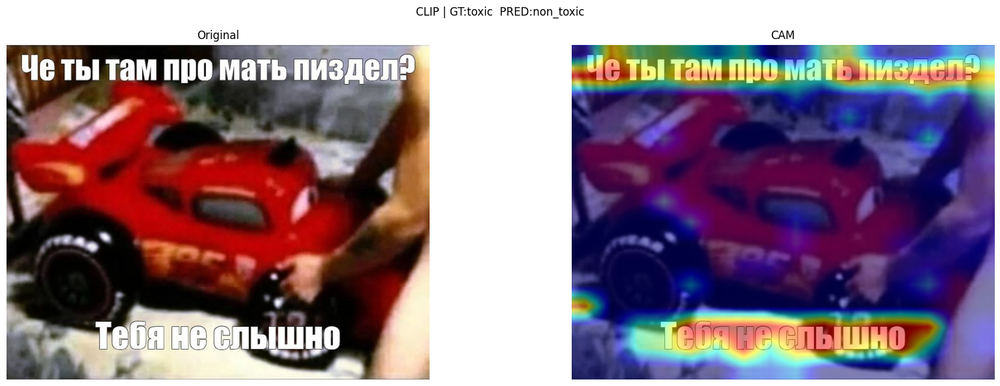

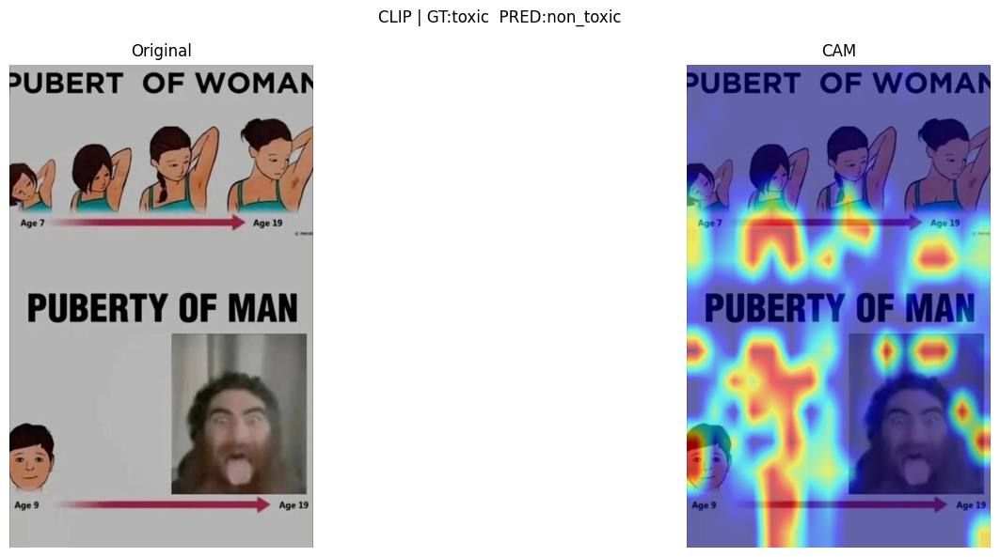

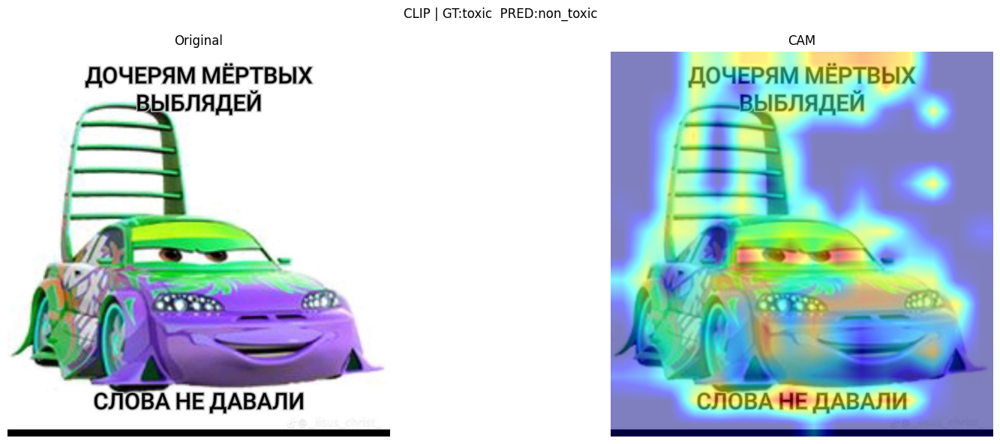

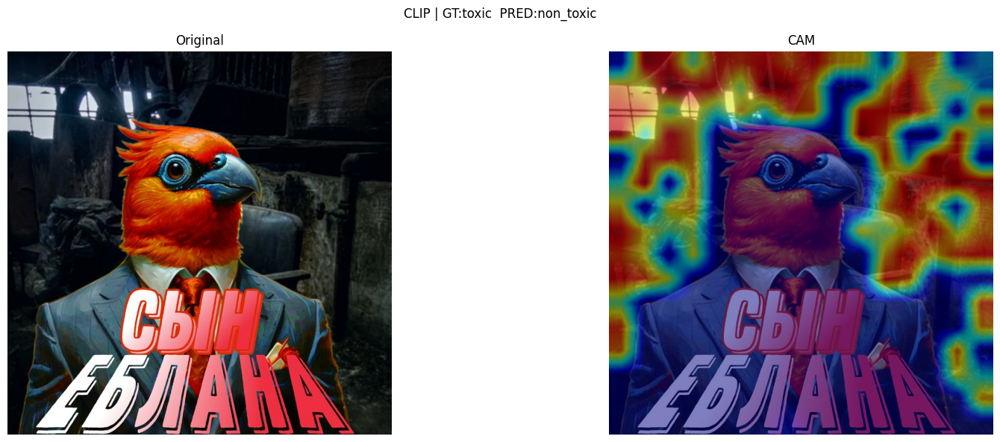

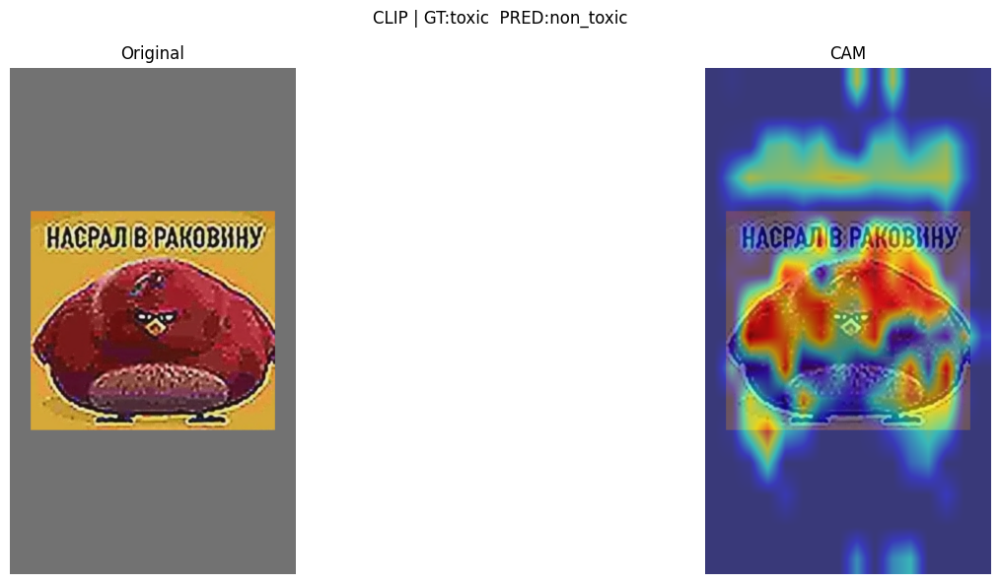

In [ ]:
def _pick_sample(df_pred, n):
    ok = df_pred[df_pred["gt"] == df_pred["pred"]]
    bad = df_pred[df_pred["gt"] != df_pred["pred"]]
    return pd.concat([
        ok.sample(min(n // 2, len(ok)), random_state=1),
        bad.sample(min(n - min(n // 2, len(ok)), len(bad)), random_state=1)
    ], ignore_index=True)

def show_cases_vlm(df_pred: pd.DataFrame, title: str, n=10, max_rationale_chars=240):
    sample = _pick_sample(df_pred, n)
    for r in sample.itertuples():
        img = Image.open(MEMES_DIR / r.file).convert("RGB")
        rationale = (getattr(r, "rationale", "") or "").replace("\n", " ")[:max_rationale_chars]
        fig, axes = plt.subplots(2, 1, figsize=(10, 7), gridspec_kw={"height_ratios": [1, 4]})
        fig.suptitle(title)
        axes[0].axis("off")
        axes[0].text(0.01, 0.95, f"GT: {r.gt} | PRED: {r.pred}", fontsize=13, va="top", ha="left")
        axes[0].text(0.01, 0.55, rationale, fontsize=12, va="top", ha="left", wrap=True)
        axes[1].imshow(img); axes[1].axis("off")
        plt.tight_layout(); plt.show()

def show_cases_clip(df_pred: pd.DataFrame, title: str, n=10):
    sample = _pick_sample(df_pred, n)
    for r in sample.itertuples():
        img = Image.open(MEMES_DIR / r.file).convert("RGB")
        try:
            cam_img = gradcam_clip_heatmap(img)
        except:
            cam_img = None

        panels = [
            ("Original", img),
            ("CAM", cam_img)
            ]

        fig, axes = plt.subplots(1, 2, figsize=(18, 6))
        fig.suptitle(f"{title} | GT:{r.gt}  PRED:{r.pred}")

        for ax, (label, img_panel) in zip(axes, panels):
            if img_panel is None:
                ax.imshow(np.ones((256, 256, 2)))
                ax.text(0.5, 0.5, f"NO {label.upper()}", ha="center", va="center", fontsize=14, color="black")
            else:
                ax.imshow(img_panel)
            ax.set_title(label)
            ax.axis("off")

        plt.tight_layout()
        plt.show()



show_cases_vlm(vlm_mine, "VLM", n=10)
show_cases_clip(clip_mine, "CLIP", n=10)


<a name="9-экспорт-результатов"></a>
## [9] Экспорт результатов (CSV артефактов в /artefacts)

In [ ]:
ART_DIR = BASE_DIR / "artefacts"
ART_DIR.mkdir(parents=True, exist_ok=True)

vlm_mine.to_csv(ART_DIR / "vlm_mine_preds.csv", index=False)
clip_mine.to_csv(ART_DIR / "clip_mine_preds.csv", index=False)

print("CSV сохранены в:", ART_DIR)

CSV сохранены в: /content/memes_project/artefacts


<a name="10-выводы"></a>
# [10] Вывод

## Цель проекта

Целью работы было понять, как мультимодальные модели (VLM и CLIP) принимают решения при классификации мемов на токсичные и нейтральные, и каким образом можно интерпретировать их работу.

## Данные

- Источник мемов: Pinterest (ручной сбор по запросам "токсичные мемы" и "нейтральные мемы").
- Собран собственный датасет (51 изображение, сбалансированны классы 25 и 26).
- Разметка выполнена вручную:
  - toxic - мем содержит направленное оскорбление, унижение, негативный выпад в адрес человека или группы.
  - non_toxic - мем может содержать грубую лексику, но не несет конкретного агрессивного обращения или унижения.
- Разметка субъективная. Цель была проверить реакцию моделей не на мат как факт, а на контекст.
- OCR использован, так как смысл токсичности в мемах чаще закодирован в тексте, а не только в картинке.

## Использованные модели

| Модель | Тип | Причина выбора |
|--------|-----|---------------|
| Qwen2.5-VL-3B-Instruct | VLM (vision-language) | Может давать текстовое объяснение, подходит для анализа рассуждений |
| CLIP ViT-L/14 | Zero-shot энкодер | Можно использовать cosine similarity и интерпретации при помощи heatmap |

## Подход

### Для VLM:
- Использован кастомный промпт на русском языке.
- Ответ модели парсится по формату JSON.
- Парсер адаптирован под русские ответы ("Токсик" и "Нейтральный"), включая частичные ключевые слова.
- Проблема: модель иногда дает корректный смысл, но распарсить класс сложно из-за вариаций формулировок.

### Для CLIP:
- Использованы два русских текстовых описания классов.
- Классификация через сравнение эмбеддингов изображения и текстовых запросов.
- Использованы Grad-CAM визуальной интерпретации.

## Результаты

- VLM Accuracy примерно 0.55. Объяснение модели иногда логичное, но классификация из-за формата ответа непостоянна. Проблема не только в модели, но и в сложном парсинге. VLM считал токсичными даже странные OCR-мусорные строки (например "АБРИКОС" в капсе), так как трактовал их как агрессивное выражение. Это подтверждает, что промпт требует дальнейшего улучшения.

- CLIP Accuracy примерно 0.5. Ловит визуальные признаки (капс, агрессивные лица, крупный текст), но не понимает смысл. Иногда помечает как токсичный мемы, где нет смысла оскорбления. Используя более мощные параметры ранее добивался более высоких показателей метрики, до 0.75.
## Интерпретация

- VLM дает текстовые объяснения. Иногда адекватные ("слово содержит оскорбление"), иногда моральные суждения без контекста ("это может кого-то обидить").
- CLIP не объясняет текстом, но Grad-CAM показывают фокус внимания в картинке, на эмоциях лица персонажа. Это подтверждает, что модель реагирует на статистические визуальные паттерны токсичности.

## Наблюдения

- OCR критически важен. Но так как модели в основном обучались на английских текстах, вероятно, можно добавить перевод.
- Моя позиция, как человека-разметчика и моделей не совпадает: модели склонны считать токсичным сам факт эмоционального визуального паттерна, даже если контент нейтрален по смыслу.

## Что можно улучшить

- Улучшить промпт для VLM: заставить давать точный формат, возможно через двухшаговую схему (сначала определить факт оскорбления, потом класс), использовать в промте английский язык.
- Добавить словарь ключевых фраз для надежного парсинга ответа.
- Расширить словарь токс-лексики в парсере.
- Для CLIP - дообучение на своих примерах или уточнение текстовых классов через несколько формулировок, использование английского языка.
- Добавить подсветку токсичных слов из OCR для наглядности.

